# imports

In [1]:
from SEAM.utils import *
import SEAM
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import matplotlib

/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/anndata/_core/anndata.py:21: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import RangeIndex
Using TensorFlow backend.


# settings

In [2]:
sns.set_style('white')
# font = {'family' : 'normal',
#         'weight' : 'bold',
#         'size'   : 2}

# matplotlib.rc('font', **font)
# matplotlib.rcParams.update({'font.size': 2})

import matplotlib.pyplot as plt

SMALL_SIZE = 8
MEDIUM_SIZE = 10
BIGGER_SIZE = 12

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title
heatmap_cmp = palettable.cmocean.diverging.Balance_20.mpl_colormap


# load

### load raw and segmented data from data/process/

In [3]:
a = sc.read_h5ad('/home/yzy/projects/SEAM/SEAM_old/data/h5ad/human/R3/data.h5ad')

In [4]:
a.uns['final_cls_colors'] = [c for c in a.uns['final_cls_colors']]

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

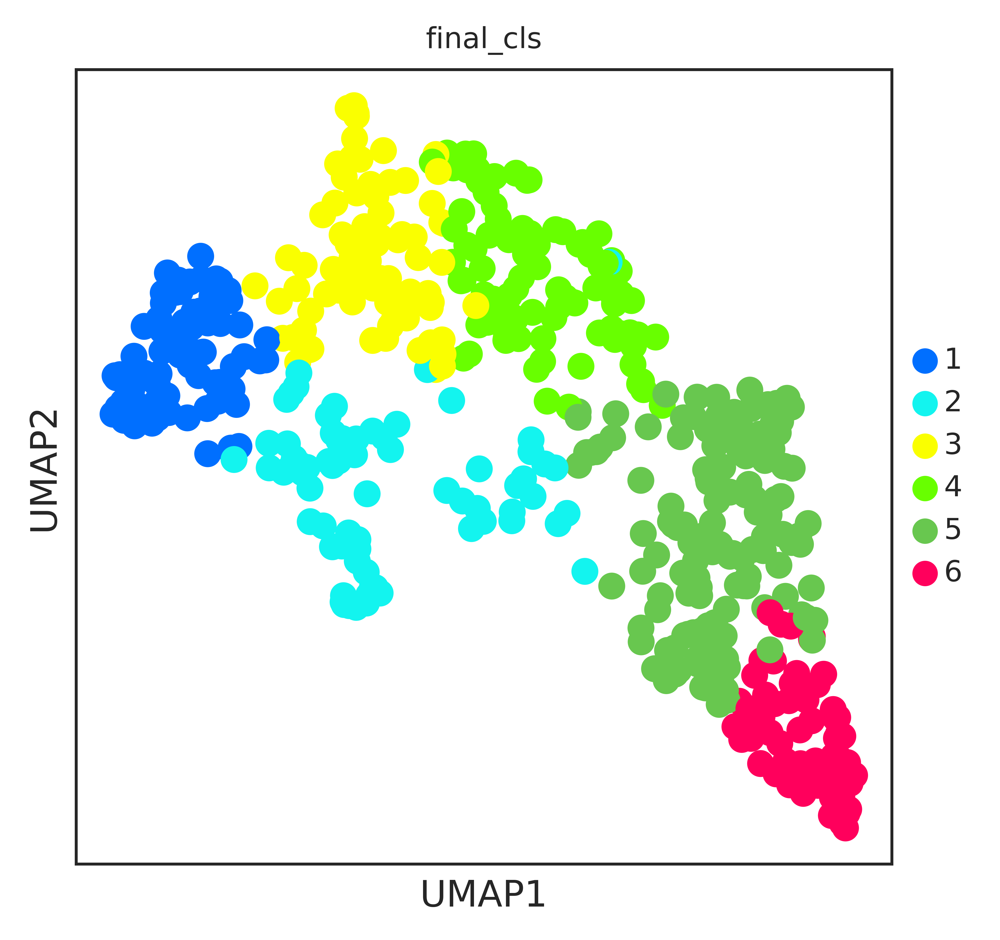

In [5]:
sc.pl.umap(a,color=['final_cls'])

In [6]:
sc.tl.rank_genes_groups(a, 'final_cls', method='t-test',reference='4')

ranking genes
    finished (0:00:00)


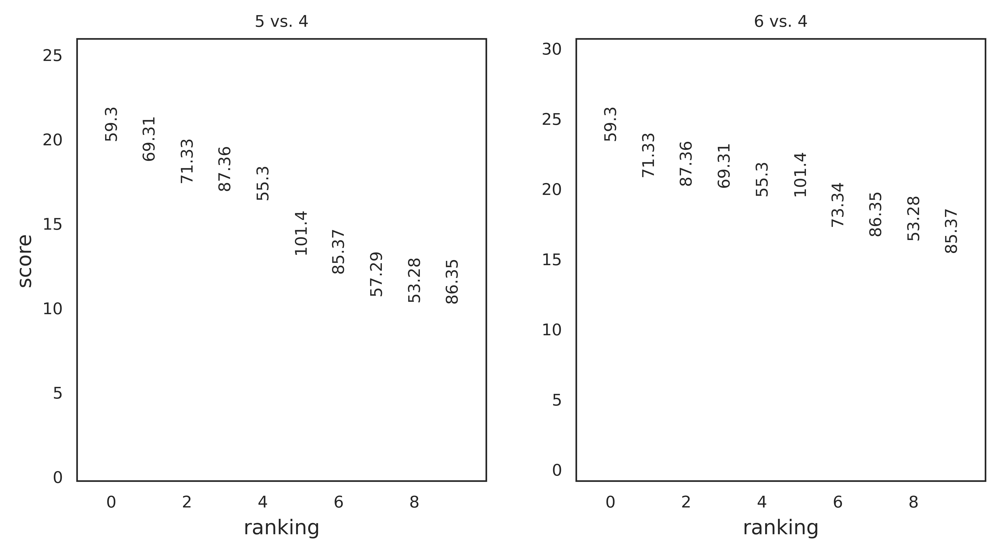

In [7]:
sc.pl.rank_genes_groups(a, n_genes=10, sharey=False,groups=['5','6'])

In [21]:
# get top 10 markers for HepaC1 and HepaC3 (reference is HepaC2)
marker_mat = np.array(a.uns['rank_genes_groups']['names'])
markers_C1 = [m[4] for m in marker_mat][0:10]
markers_C3 = [m[3] for m in marker_mat][0:10]
# a.uns['rank_genes_groups']['names']

In [9]:
markers = ['59.3','69.31','71.33','87.36','55.3','101.4','85.37','57.29','53.28','86.35']


In [24]:
import scipy
# calculate overlap test
cur_use1 = np.array(markers_C1)
cur_use2 = np.array(markers_C3)
cur_overlap = np.intersect1d(cur_use1,cur_use2).shape[0]
cur_total = a.shape[1]
cur_list1 = max(cur_use1.shape[0],cur_use2.shape[0])
cur_list2 = min(cur_use1.shape[0],cur_use2.shape[0])
cur_p = scipy.stats.hypergeom.sf(cur_overlap-1,cur_total,cur_list1,cur_list2)
cur_p_log = -np.log10(cur_p)

In [37]:

sc.pl.umap(a,color=markers,
           cmap=heatmap_cmp)

In [17]:
sc.tl.rank_genes_groups(a, 'final_cls', method='t-test',reference='4')

ranking genes
    finished (0:00:00)


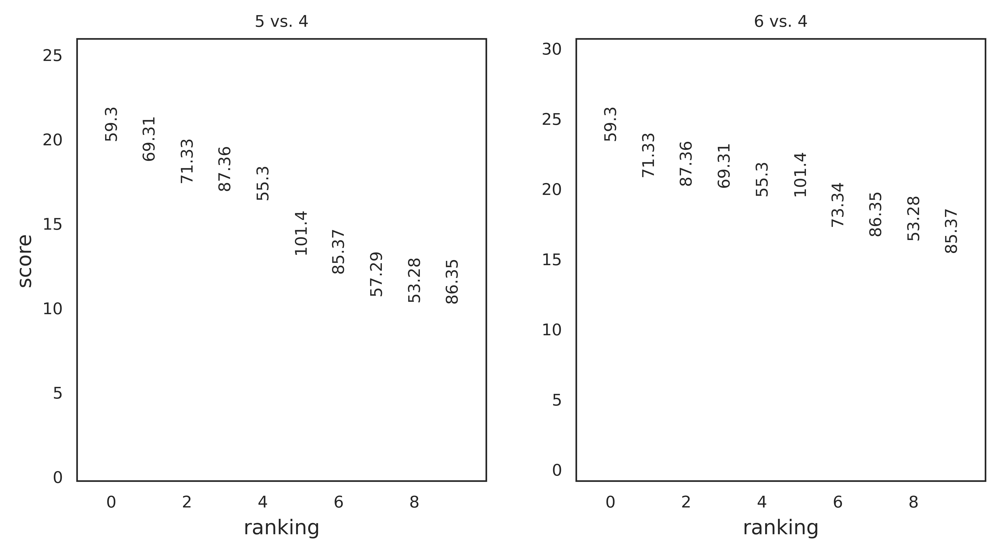

In [19]:
sc.pl.rank_genes_groups(a, n_genes=10, sharey=False,groups=['5','6'])

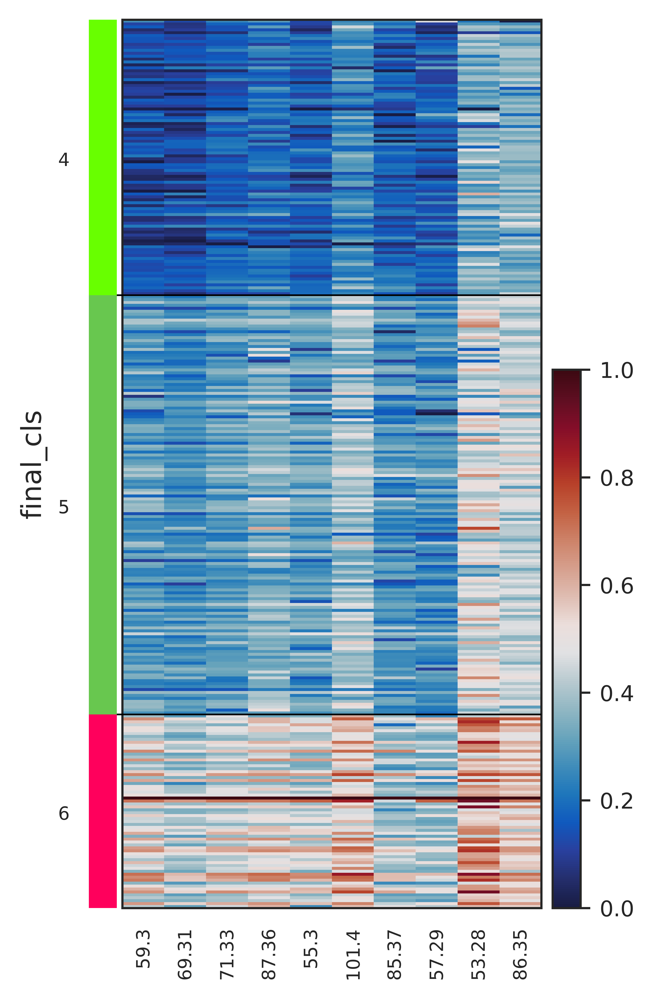

GridSpec(2, 4, height_ratios=[0, 6], width_ratios=[0.2, 3.0, 0, 0.2])

In [35]:
markers = ['59.3','69.31','71.33','87.36','55.3','101.4','85.37','57.29','53.28','86.35']

sc.pl.heatmap(a[np.isin(a.obs['final_cls'],['4','5','6'])], markers,groupby='final_cls',standard_scale='var', cmap=heatmap_cmp,dendrogram=False,save=None)


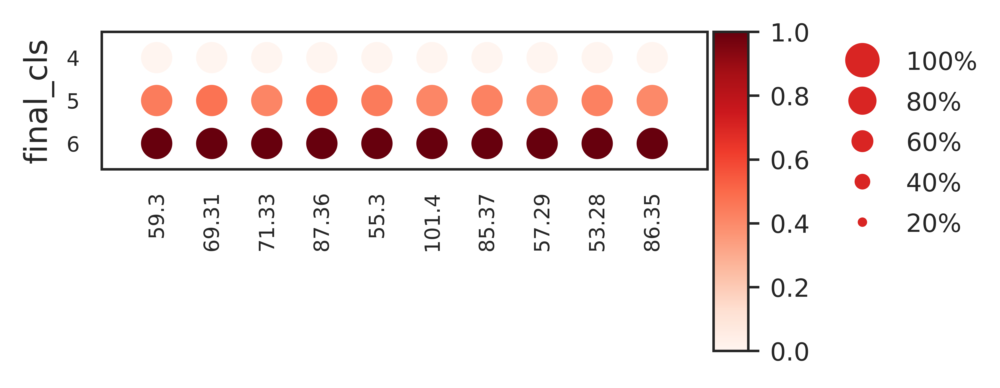

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[3.5, 0, 0.2, 0.5, 0.25])

In [36]:
# markers = ['59.3','69.31','71.33','87.36','55.3','101.4']

sc.pl.dotplot(a[np.isin(a.obs['final_cls'],['4','5','6'])], markers,groupby='final_cls',standard_scale='var',dendrogram=False,save=None)


In [13]:
def get_pixelProfile_from_clsID(cls_id_list,cls_array):
    cell_idx = np.where(np.isin(cls_array,cls_id_list))[0]
    pixel_profile_mat = np.array(a.X)[cell_idx,:]
    return pixel_profile_mat

In [36]:
pd_dict = {
    'm/z':[],
    'cls':[],
    'intensity':[],
    'cls_name':[]
}
for c in ['4','5','6']:
    cls_id_list = [c]
    cls_array = np.array(a.obs['final_cls'])
    marker_idx = [np.where(np.array(a.var_names)==m)[0][0] for m in markers]
    cell_profile = get_pixelProfile_from_clsID(cls_id_list,cls_array)[:,marker_idx]
    for i in range(cell_profile.shape[0]):
        for j in range(cell_profile.shape[1]):
            cur_m = markers[j]
            cur_cls = c
            if c=='4':
                cls_name = 'C2'
            if c=='5':
                cls_name = 'C3'
            if c=='6':
                cls_name = 'C1'
            pd_dict['cls_name'].append(cls_name)
            cur_intensity = cell_profile[i,j]
            pd_dict['m/z'].append(cur_m)
            pd_dict['cls'].append(cur_cls)
            pd_dict['intensity'].append(cur_intensity)

In [38]:
tmp = [1,2,3]
tmp[-1:0]

[]

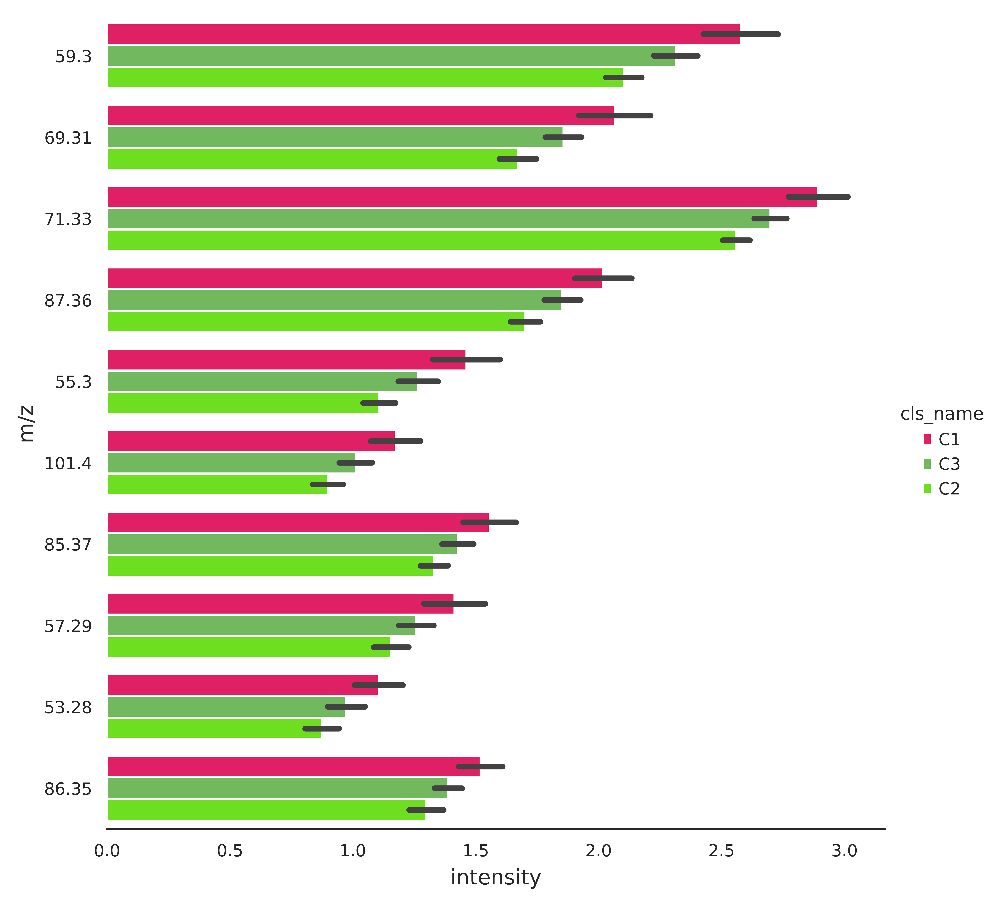

In [40]:
pd_df = pd.DataFrame(pd_dict)
cmp_bold = palettable.cartocolors.qualitative.Bold_10.mpl_colors
# cmp_use = [cmp_bold[4],cmp_bold[0],cmp_bold[1],cmp_bold[2],cmp_bold[3],cmp_bold[5]]
# hue_order = ['SIMSCut','EB','HMRF','RW','Threshold','WSedt']
hue_order = ['C1','C3','C2']
cmp_use = a.uns['final_cls_colors'][-3:][::-1]
order = markers
g = sns.catplot(
    data=pd_df, kind="bar",
    x="intensity", y="m/z", hue="cls_name",aspect=1,
    ci="sd", alpha=1, height=6,
    order=order,palette=cmp_use,hue_order=hue_order,
    orient='h',
)
g.despine(left=True)
g.set_axis_labels("intensity", "m/z")
# g.legend.set_title("")

# View

### run SIMS-View with DR_method=Umap

In [6]:
a = SEAM.tl.View(a,method='Umap')

/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../anaconda3/envs/scaden/lib/python3.7/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  state.func_ir.loc))
/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../anaconda3/e

### show result of SIMS-View

In [7]:
SEAM.pl.View(a,method='Umap')

/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 918 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


# Cut

### get segmented mask and cell position, and write into anndata

In [8]:
a=SEAM.tl.Cut(a)

setting obsm: spatial


## each cell represented as a dot

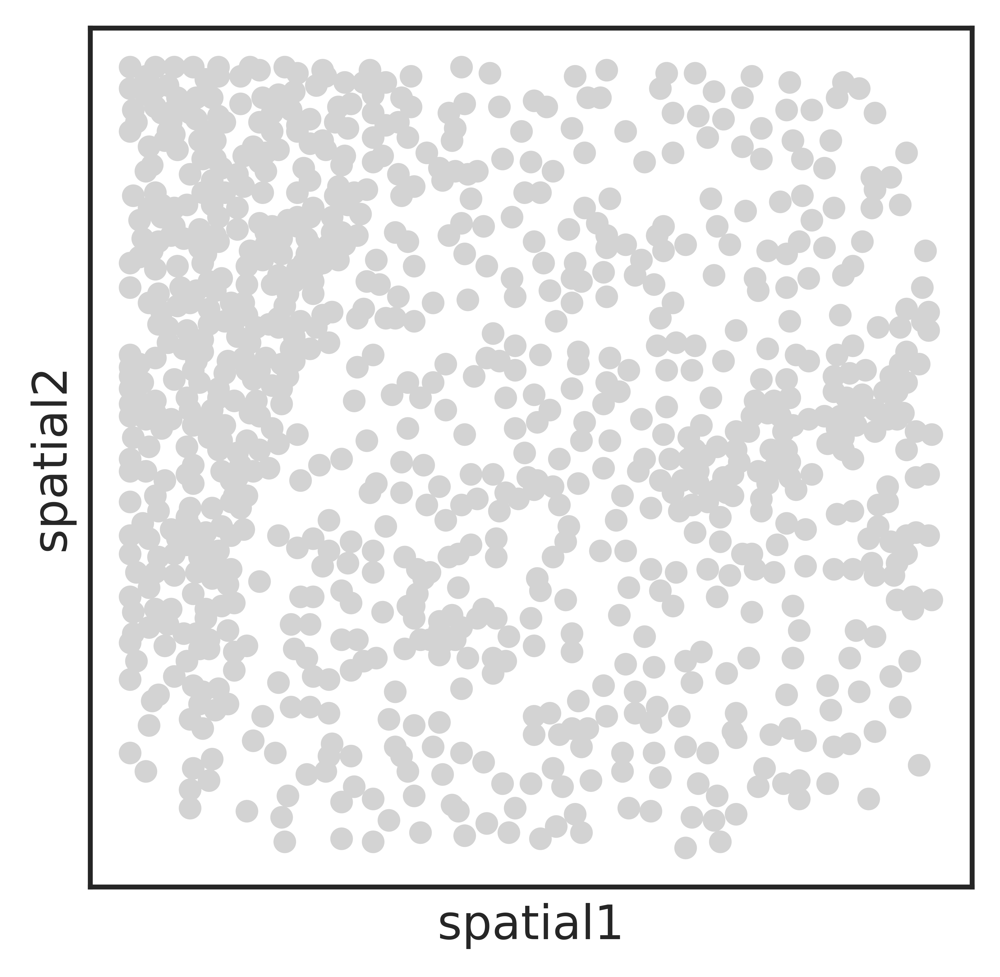

In [9]:
SEAM.pl.Cut(a,method='dot')

## each cell represented as a segmented mask

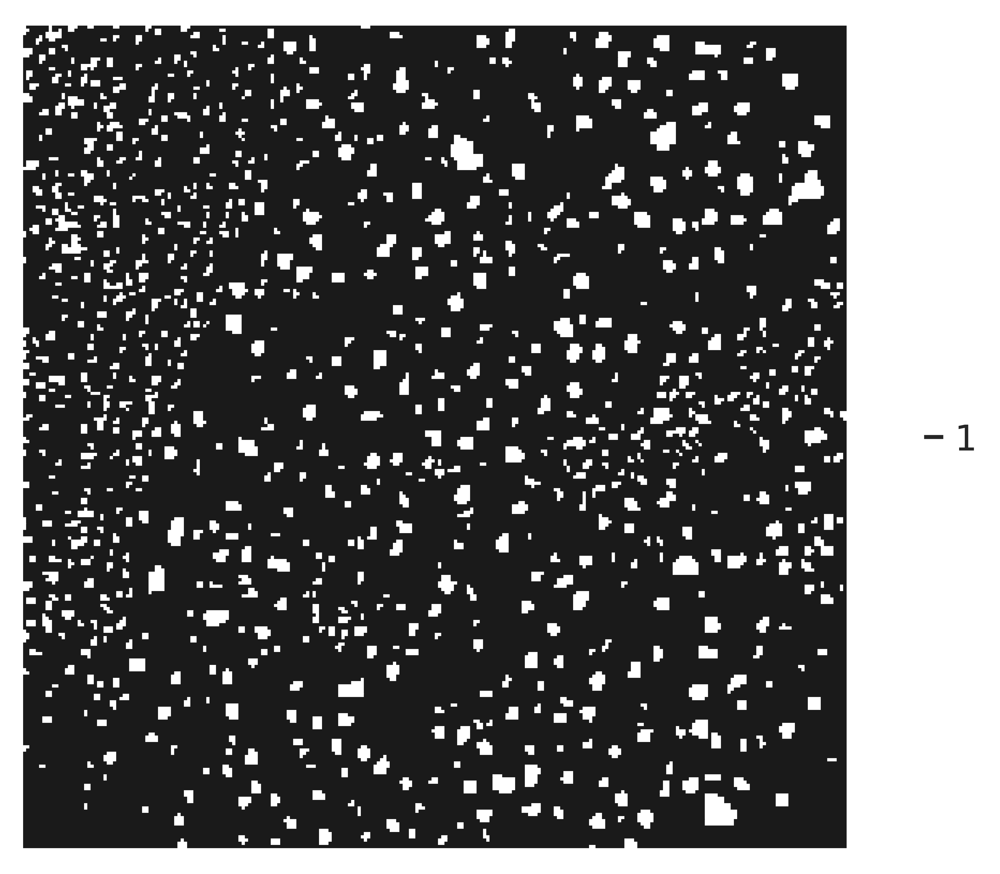

In [10]:
SEAM.pl.Cut(a,method='mask')

# ID&Cluster

### run SIMS-ID with epochs and temperature.

In [11]:
a = SEAM.tl.ID(a,epochs=500,t=5)

/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


Epoch 1/500
7145/7145 [==============================] - 1s 192us/step - loss: 6.6816 - softmax_loss: 6.6801 - center_loss: 4.1880
Epoch 2/500
7145/7145 [==============================] - 1s 144us/step - loss: 6.3706 - softmax_loss: 6.3701 - center_loss: 7.2703
Epoch 3/500
7145/7145 [==============================] - 1s 132us/step - loss: 6.1282 - softmax_loss: 6.1275 - center_loss: 13.9051
Epoch 4/500
7145/7145 [==============================] - 1s 138us/step - loss: 5.9599 - softmax_loss: 5.9598 - center_loss: 26.1193
Epoch 5/500
7145/7145 [==============================] - 1s 125us/step - loss: 5.8617 - softmax_loss: 5.8621 - center_loss: 37.2318
Epoch 6/500
7145/7145 [==============================] - 1s 192us/step - loss: 5.7959 - softmax_loss: 5.7964 - center_loss: 48.0922
Epoch 7/500
7145/7145 [==============================] - 1s 112us/step - loss: 5.7540 - softmax_loss: 5.7542 - center_loss: 57.6792
Epoch 8/500
7145/7145 [==============================] - 1s 116us/step - loss:

### dump intermediate results

In [12]:
a.write_h5ad('../../data/demo_dump/ID.h5ad')

### run Cluster methods with cell representation method of SIMS-ID

In [13]:
a = SEAM.tl.Cluster(a,method='SIMLR',cluster_param=5,rep='ID')

(902, 7145) 5
SIMLR highly recommends you to perform PCA first on the data

Please use the in-line function fast_pca on your input



/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/SIMLR/core.py:70: FutureWarning: The default argument for metric will be removed in future version of Annoy. Please pass metric='angular' explicitly.
  t = AnnoyIndex(d)
/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/SIMLR/core.py:75: FutureWarning: The default argument for metric will be removed in future version of Annoy. Please pass metric='angular' explicitly.
  u = AnnoyIndex(d)


Successfully Run SIMLR! SIMLR took 2.737932 seconds in total

done!


### umap embedding with cell representation method of SIMS-ID

In [14]:
a = SEAM.tl.Umap(a,rep='ID')

computing neighbors
    finished (0:00:01)
computing UMAP
    finished (0:00:02)
Sucessfully run Umap!


### Umap embedding colored coded by SIMLR result

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

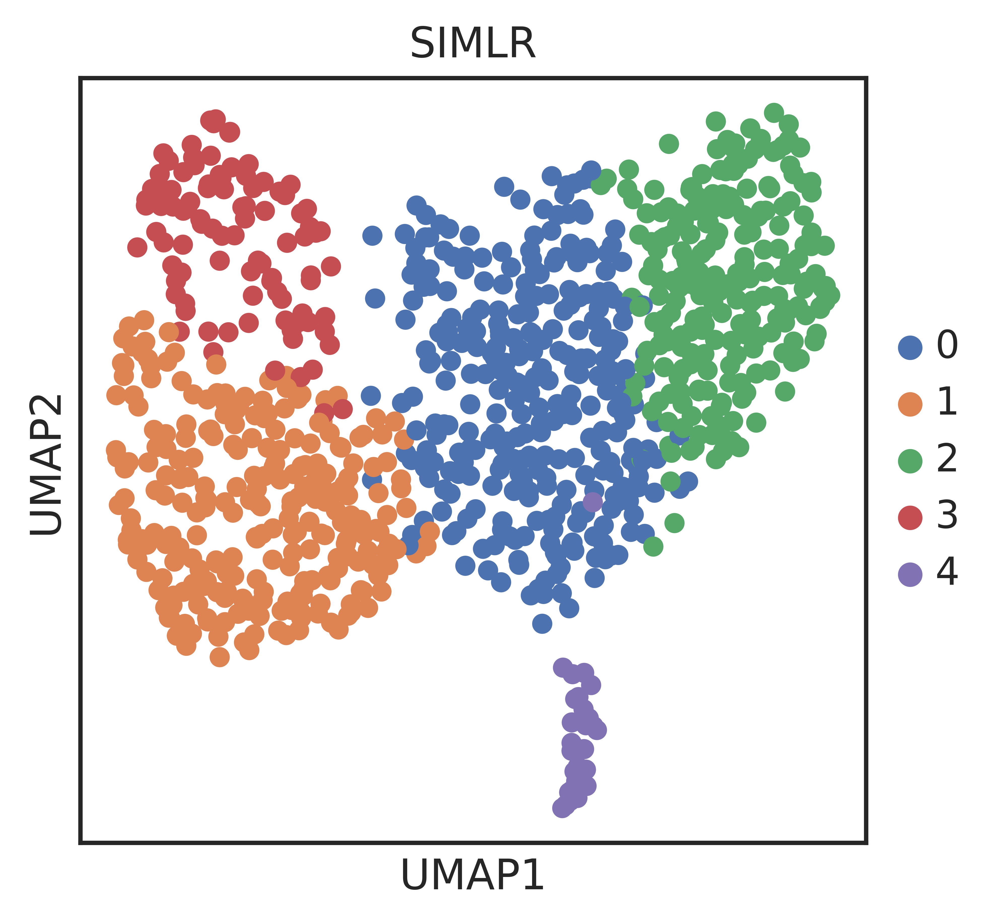

In [15]:
SEAM.pl.ID(a)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

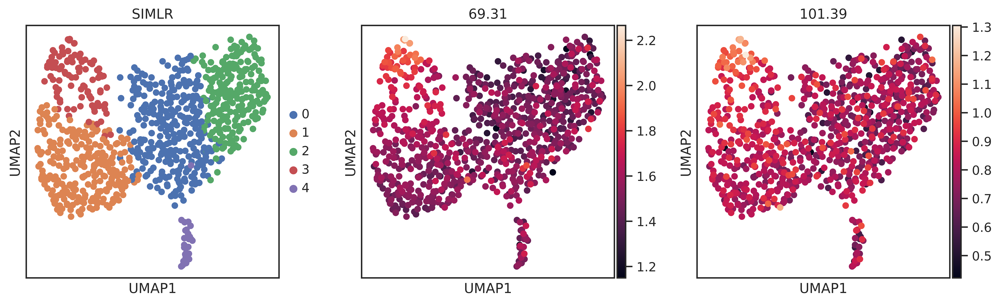

In [16]:
sc.pl.umap(a,color=['SIMLR','69.31','101.39'])

### spatial single cell map colored by SIMLR

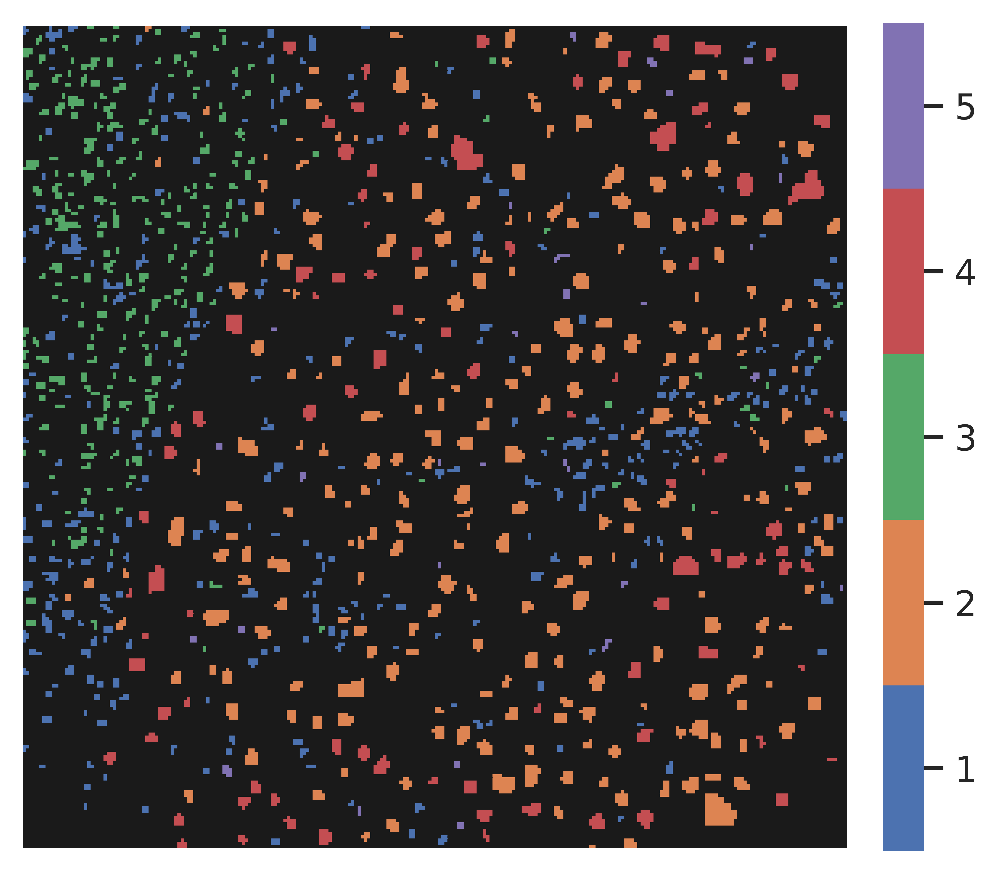

In [17]:
SEAM.pl.Cluster(a,cls='SIMLR',groups=range(5),method='mask')

### spatial single cell map of particular clusters 

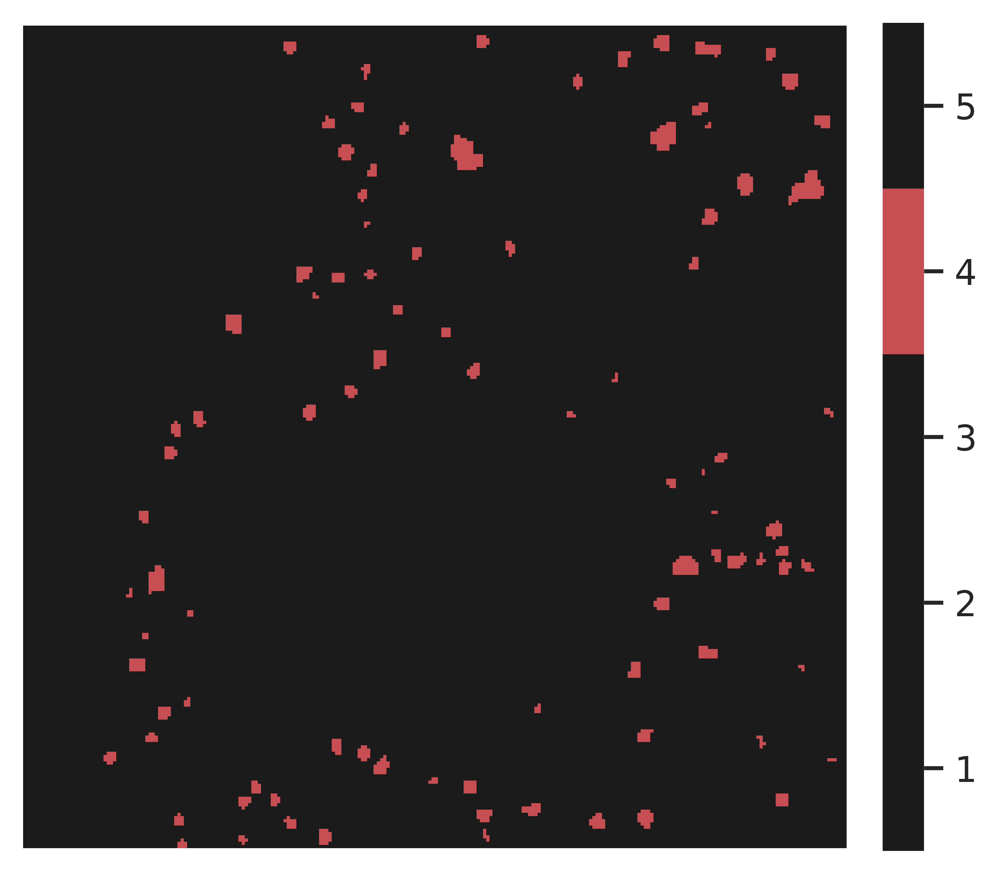

In [18]:
SEAM.pl.Cluster(a,cls='SIMLR',groups=[3],method='mask')